<div align="center">
    <img src="https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/apple/325/dog_1f415.png">
</div>

<h1 align="center">Cats & Dogs CNN</h1>

# Setting up

## Installing packages

In [1]:
%%capture
# %%capture for discarding the output, remove it if you need to debug this cell
# Using this syntax as recommended here: https://jakevdp.github.io/blog/2017/12/05/installing-python-packages-from-jupyter/
import sys
!{sys.executable} -m pip install opendatasets
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install sklearn
!{sys.executable} -m pip install tensorflow
!{sys.executable} -m pip install keras

## Importing dependencies

In [64]:
import opendatasets as od
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import numpy as np
from sklearn.datasets import load_files
import tensorflow as tf
from tensorflow import keras
from keras.utils import np_utils
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

## Downloading dataset

In [3]:
# Using the opendatasets library: https://github.com/JovianML/opendatasets
# Uses the Kaggle Official API, will ask for your Kaggle API credentials
od.download('https://www.kaggle.com/datasets/tongpython/cat-and-dog')

Skipping, found downloaded files in "./cat-and-dog" (use force=True to force download)


-> Removing \_DS_Store files in the dataset

In [4]:
!find . -name "_DS_Store" -type f -delete

# Exploring the data

-> Showing a couple of images to get a sense of how the data looks:

In [5]:
path = './cat-and-dog/'
train_path = f'{path}training_set/training_set/'
test_path = f'{path}test_set/test_set/'

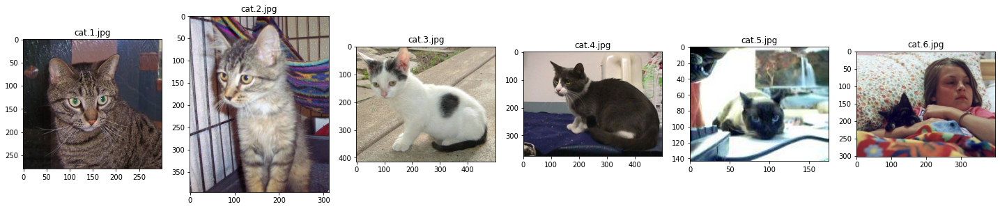

In [6]:
_, axarr = plt.subplots(1, 6, figsize=(25, 5))
for i in range(6):
    filename = f'cat.{i+1}.jpg'
    axarr[i].imshow(mpimg.imread(f'{train_path}cats/{filename}'))
    axarr[i].set_title(filename)

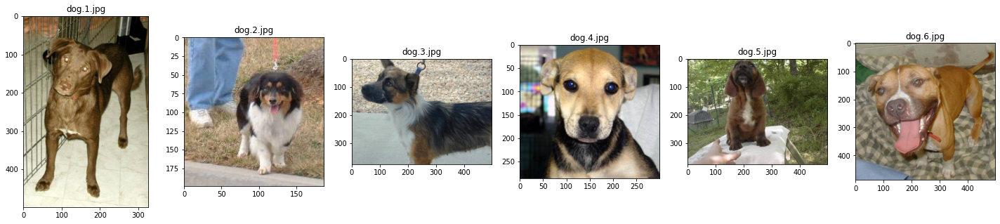

In [7]:
_, axarr = plt.subplots(1, 6, figsize=(25, 5))
for i in range(6):
    filename = f'dog.{i+1}.jpg'
    axarr[i].imshow(mpimg.imread(f'{train_path}dogs/{filename}'))
    axarr[i].set_title(filename)

-> Counting the number of different categories, and the number of samples, for both training and testing sets:  
(Training and testing sets are already separated in this dataset, there is no need to split it ourselves)

In [8]:
train_categories, train_samples_counts = [], []
test_categories, test_samples_counts = [], []

for i in sorted(os.listdir(train_path)):
    train_categories.append(i)
    train_samples_counts.append(len(os.listdir(f'{train_path}{i}')))

for i in sorted(os.listdir(test_path)):
    test_categories.append(i)
    test_samples_counts.append(len(os.listdir(f'{test_path}{i}')))

print('train_categories == test_categories ?', train_categories == test_categories)
categories = train_categories
print('Number of categories:', len(categories))

train_categories == test_categories ? True
Number of categories: 2


In [9]:
count_train_samples = sum(train_samples_counts)
count_test_samples = sum(test_samples_counts)
count_samples_total = count_train_samples + count_test_samples
print('Number of samples:')
print('Train:', count_train_samples)
print('Test:', count_test_samples)
print('Total:', count_samples_total)
print('Ratio Train/Total:', '{0:.0%}'.format(count_train_samples / count_samples_total))

Number of samples:
Train: 8005
Test: 2023
Total: 10028
Ratio Train/Total: 80%


-> Plotting the number of samples per categories:

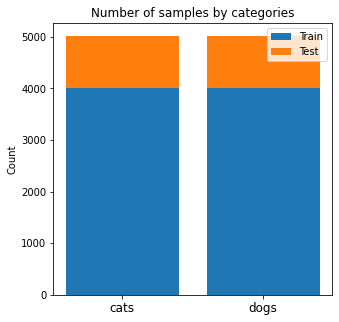

In [10]:
plt.rcParams["figure.figsize"] = [5, 5]

_, ax = plt.subplots()
ax.set_title('Number of samples by categories')
ax.bar(categories, train_samples_counts, label='Train')
ax.bar(categories, test_samples_counts, bottom=train_samples_counts, label='Test')
ax.set_ylabel('Count')
ax.legend()

plt.xticks(categories, fontsize = 12)
plt.show()

# Loading the dataset

In [11]:
# Utility function for loading the whole dataset using sklearn's load_files function
def load_dataset(path):
    data = load_files(path)
    x = np.array(data['filenames'])
    y = np.array(data['target'])
    return x, y

In [12]:
# Loading the dataset
x_train, y_train = load_dataset(train_path)
x_test, y_test = load_dataset(test_path)
target_labels = np.array(categories)

In [13]:
print(x_train[:2])
print(x_test[:2])

['./cat-and-dog/training_set/training_set/dogs/dog.1877.jpg'
 './cat-and-dog/training_set/training_set/cats/cat.738.jpg']
['./cat-and-dog/test_set/test_set/cats/cat.4945.jpg'
 './cat-and-dog/test_set/test_set/dogs/dog.4479.jpg']


For now, x_train and x_test contain the paths to the images. We will load the actual images after that.

In [14]:
print(y_train)
print(y_test)

[1 0 0 ... 0 0 0]
[0 1 1 ... 1 0 0]


y_train and y_test contain the number of the category to which each image belong.

In [15]:
print(target_labels)

['cats' 'dogs']


target_labels is just the labels of the categories as a numpy array.

-> Loading the images:

In [16]:
# Utility function for loading the images using TensorFlow Kera's load_image and img_to_array functions
# load_image loads the image at the designated path into PIL format, also resize the images to a constant size of 256 x 256
# img_to_array converts the PIL Image instance into A 3D Numpy array
def load_images_to_arrays(paths):
    images_arrays = []
    for path in paths:
        images_arrays.append(img_to_array(load_img(path, target_size = (256, 256))))
    return np.array(images_arrays)

Actually loading the images, this may take some time:

In [17]:
x_train = load_images_to_arrays(x_train)

In [18]:
x_test = load_images_to_arrays(x_test)

In [19]:
print(x_train.shape)
print(x_test.shape)

(8005, 256, 256, 3)
(2023, 256, 256, 3)


(Number of samples, Image height, Image width, RGB)

In [20]:
print(x_train[0][50][50])

[176. 176. 168.]


This is the RGB value of the center pixel of the first training image.

# Data Preprocessing

-> Image Normalization (scaling pixels' RGB values from 0-255 to 0-1):  
This reduces training time by simplifying the computations.

In [21]:
x_train = x_train.astype('float32') / 255

In [22]:
x_test = x_test.astype('float32') / 255

In [23]:
print(x_train[0][50][50])

[0.6901961  0.6901961  0.65882355]


This is the RGB value of the center pixel of the first training image on a scale going from 0 to 1 instead of 0 to 255.

-> Turning responses into vectors of categories:  
ex: 'Strawberry' => [0, 0, 0, 1, 0] out of ['Banana', 'Peach', 'Kiwi', 'Strawberry', 'Cherry']

In [24]:
if len(np.unique(target_labels)) == len(np.unique(y_train)) == len(np.unique(y_test)):
    number_of_classes = len(np.unique(target_labels))

In [25]:
print('Y train dimension::', y_train.shape)
print('Y test dimension:', y_test.shape)

Y train dimension:: (8005,)
Y test dimension: (2023,)


In [26]:
y_train = np_utils.to_categorical(y_train, number_of_classes)
y_test = np_utils.to_categorical(y_test, number_of_classes)

In [27]:
print('Y train dimension:', y_train.shape)
print('Y test dimension:', y_test.shape)

Y train dimension: (8005, 2)
Y test dimension: (2023, 2)


# Building the CNN model

In [28]:
# Basic model with a plain stack of layers where each layer has exactly one input tensor and one output tensor
model = Sequential()

2022-08-11 22:25:04.249729: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


-> Feature extraction part:

In [29]:
# 2D convolutional layer: extracts low-level features after applying filters to original input to reduce their number
model.add(Conv2D(filters = 16,
                 kernel_size = 2,
                 input_shape = (256, 256, 3),
                 padding='same'))

# Activation function: decides which neurons should fire. We use ReLU because it works great with CNNs and it's fast.
model.add(Activation('relu'))

# Reduces dimensionality
model.add(MaxPooling2D(pool_size = 2))

# Extracts medium-level features
model.add(Conv2D(filters = 32,
                 kernel_size = 2,
                 activation = 'relu',
                 padding = 'same'))

# Reduces dimensionality
model.add(MaxPooling2D(pool_size = 2))

# Extracts high-level features
model.add(Conv2D(filters = 64,
                 kernel_size = 2,
                 activation = 'relu',
                 padding = 'same'))

# Reduces dimensionality
model.add(MaxPooling2D(pool_size = 2))

# Extracts top-level features
model.add(Conv2D(filters = 128,
                 kernel_size = 2,
                 activation = 'relu',
                 padding = 'same'))

# Reduces dimensionality
model.add(MaxPooling2D(pool_size = 2))

-> Classification part:

In [30]:
# Drop some neurons from previous layers to reduce overfitting
model.add(Dropout(0.3))

# Converts the pooled 2D array of features into a 1D array
model.add(Flatten())

# Reduces the number of features
model.add(Dense(150))

# ReLU activation function: decides which neurons should fire as before
model.add(Activation('relu'))

# Reduces overfitting
model.add(Dropout(0.4))

# Softmax activation function: normalize the output to probabilities for each predicted output classes
model.add(Dense(2, activation = 'softmax'))

-> Model summary:

In [41]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 16)      208       
                                                                 
 activation (Activation)     (None, 256, 256, 16)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      2080      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)        8

-> Compiling the model:

In [33]:
model.compile(loss = 'binary_crossentropy', # only two output classes
              optimizer = 'rmsprop', # Root Mean Squared Propagation optimization algorithm
              metrics = ['accuracy']) # percentage of correct predictions over all predictions

# Training the model

In [34]:
history = model.fit(x_train,
                    y_train,
                    batch_size = 32,
                    epochs = 10,
                    validation_data = (x_test, y_test),
                    verbose = 2,
                    shuffle = True)

Epoch 1/10
251/251 - 234s - loss: 0.4722 - accuracy: 0.7791 - val_loss: 0.5668 - val_accuracy: 0.7266 - 234s/epoch - 930ms/step
Epoch 2/10
251/251 - 225s - loss: 0.4286 - accuracy: 0.8061 - val_loss: 0.5476 - val_accuracy: 0.7237 - 225s/epoch - 895ms/step
Epoch 3/10
251/251 - 235s - loss: 0.3998 - accuracy: 0.8254 - val_loss: 0.4825 - val_accuracy: 0.7988 - 235s/epoch - 935ms/step
Epoch 4/10
251/251 - 220s - loss: 0.3750 - accuracy: 0.8417 - val_loss: 0.5304 - val_accuracy: 0.7815 - 220s/epoch - 875ms/step
Epoch 5/10
251/251 - 219s - loss: 0.3424 - accuracy: 0.8575 - val_loss: 0.4908 - val_accuracy: 0.7746 - 219s/epoch - 872ms/step
Epoch 6/10
251/251 - 208s - loss: 0.3235 - accuracy: 0.8672 - val_loss: 0.6266 - val_accuracy: 0.7934 - 208s/epoch - 828ms/step
Epoch 7/10
251/251 - 206s - loss: 0.3061 - accuracy: 0.8731 - val_loss: 0.5308 - val_accuracy: 0.7874 - 206s/epoch - 821ms/step
Epoch 8/10
251/251 - 207s - loss: 0.2855 - accuracy: 0.8846 - val_loss: 0.7932 - val_accuracy: 0.7370 - 

# Model evaluation

In [35]:
scores = model.evaluate(x_test, y_test)
print('Final test accuracy:', scores[1])

64/64 [==============================] - 16s 236ms/step - loss: 0.6445 - accuracy: 0.7929
Final test accuracy: 0.7928818464279175


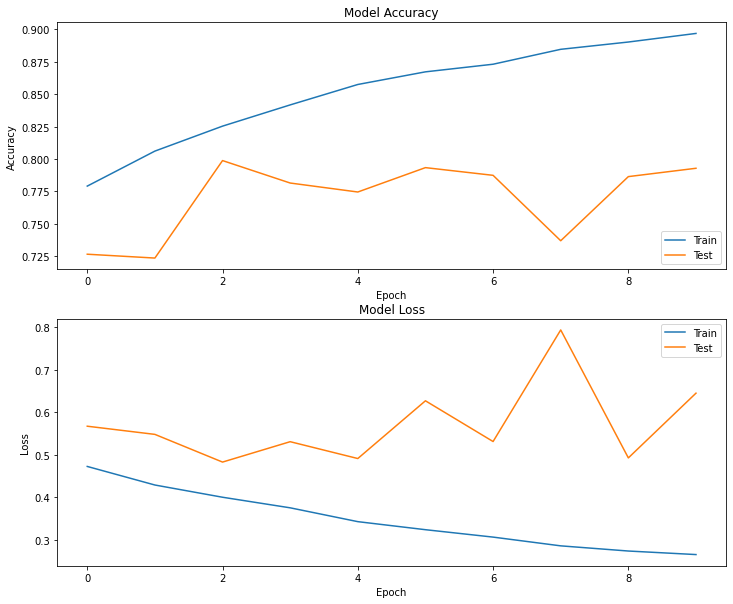

In [38]:
plt.figure(1, figsize = (12, 10))  

# Accuracy history
plt.subplot(211)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc = 'lower right')

# Loss history
plt.subplot(212)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc = 'upper right')

plt.show()

# Vanilla CNN Conclusion

Using a Vanilla CNN, we are able to classify cats and dogs in this dataset with an accuracy of 79%.

# Transfer Learning using ResNet-50

We are now going to use the [ResNet-50](https://www.kaggle.com/datasets/keras/resnet50) Pre-trained Model to see if we can attain better results.  
With transfer learning, we use a model that is often very deep (many layers) and that has already been trained on huge amounts of data to see if we can generalize its results on our dataset.

In [51]:
od.download('https://www.kaggle.com/datasets/alexisbcook/resnet50')

100%|█████████████████████████████████████████████████████████| 174M/174M [01:27<00:00, 2.10MB/s]


In [52]:
resnet_weights_path = './resnet50/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'

In [67]:
model_transfer = Sequential()

model_transfer.add(ResNet50(include_top = False,
                            pooling = 'avg',
                            weights = resnet_weights_path,
                            input_shape = (256, 256, 3)))

model_transfer.add(Dense(2, activation = 'softmax'))

# Setting the ResNet layer as not trainable as it has already been trained
model_transfer.layers[0].trainable = False

In [68]:
model_transfer.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense_3 (Dense)             (None, 2)                 4098      
                                                                 
Total params: 23,591,810
Trainable params: 4,098
Non-trainable params: 23,587,712
_________________________________________________________________


In [69]:
sgd = SGD(learning_rate = 0.01,
          decay = 1e-6,
          momentum = 0.9,
          nesterov = True)

model_transfer.compile(loss = 'binary_crossentropy',
                       optimizer = sgd,
                       metrics = ['accuracy'])

In [70]:
# Early stopping
cb_early_stopper = EarlyStopping(monitor = 'val_loss',
                                 patience = 3)

# Saving a checkpoint of the best model in ./models and restoring it as our final model for predictions
cb_checkpointer = ModelCheckpoint(filepath = './models/best.hdf5',
                                  monitor = 'val_loss',
                                  save_best_only = True,
                                  mode = 'auto')

In [72]:
history = model_transfer.fit(x_train,
                             y_train,
                             batch_size = 128,
                             epochs = 5,
                             validation_data = (x_test, y_test),
                             verbose = 2,
                             shuffle = True,
                             callbacks = [cb_early_stopper, cb_checkpointer])

Epoch 1/5
63/63 - 657s - loss: 0.7095 - accuracy: 0.5703 - val_loss: 0.7531 - val_accuracy: 0.5131 - 657s/epoch - 10s/step
Epoch 2/5
63/63 - 660s - loss: 0.6878 - accuracy: 0.5918 - val_loss: 0.6672 - val_accuracy: 0.5986 - 660s/epoch - 10s/step
Epoch 3/5
63/63 - 792s - loss: 0.6647 - accuracy: 0.6096 - val_loss: 0.6733 - val_accuracy: 0.5887 - 792s/epoch - 13s/step
Epoch 4/5
63/63 - 660s - loss: 0.6718 - accuracy: 0.6000 - val_loss: 0.6416 - val_accuracy: 0.6382 - 660s/epoch - 10s/step
Epoch 5/5
63/63 - 663s - loss: 0.6981 - accuracy: 0.5893 - val_loss: 0.6422 - val_accuracy: 0.6303 - 663s/epoch - 11s/step


This is not working as I expected.  
We get very long training time and an accuracy of only 63% compared to the 79% of the vanilla model.  
There are a lot of parameters we could play with to try to get better results but I am running out of time so I'm going to leave it there as of right now.

# Predictions with vanilla CNN

In [73]:
predictions = model.predict(x_test)

64/64 [==============================] - 12s 178ms/step


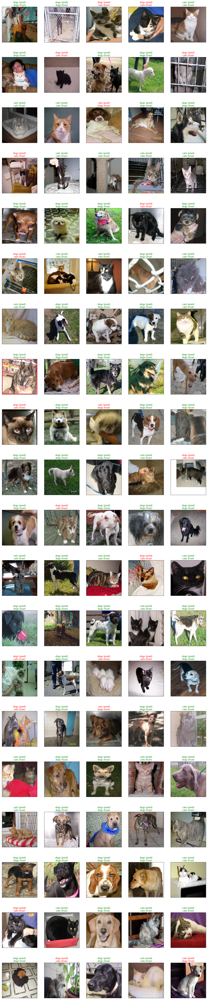

In [74]:
fig = plt.figure(figsize = (20, 100))
for i, idx in enumerate(np.random.choice(x_test.shape[0], size = 100, replace = False)):
    pred_idx = np.argmax(predictions[idx])
    true_idx = np.argmax(y_test[idx])
    
    ax = fig.add_subplot(20, 5, i+1, xticks = [], yticks = [])
    ax.imshow(np.squeeze(x_test[idx]))
    ax.set_title(f'{target_labels[pred_idx]} (pred)\n{target_labels[true_idx]} (true)',
                 color = ('green' if pred_idx == true_idx else 'red'))